# Imports

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno
import gc
import matplotlib.pyplot as plt
from xgboost import XGBClassifier
import xgboost
from sklearn.metrics import roc_auc_score
from sklearn.linear_model import LogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
import pickle
import time
import functions.utils as utils
import functions.preprocessing as preprocessing
import functions.evaluation as evaluation

In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

#Defaults styles:
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('pdf', 'png')
pd.options.display.float_format = '{:.2f}'.format
rc={'savefig.dpi': 75, 'figure.autolayout': False, 'figure.figsize': [12, 8], 'axes.labelsize': 18,\
   'axes.titlesize': 18, 'font.size': 18, 'lines.linewidth': 2.0, 'lines.markersize': 8, 'legend.fontsize': 16,\
   'xtick.labelsize': 16, 'ytick.labelsize': 16}

sns.set(style='dark',rc=rc)
default_color = '#56B4E9'
colormap = plt.cm.cool

In [3]:
# Setting working directory
path = './data/raw/'
output_path = './data/output/'

# Data Description

Many people struggle to get loans due to insufficient or non-existent credit histories. And, unfortunately, this population is often taken advantage of by untrustworthy lenders.

Home Credit strives to broaden financial inclusion for the unbanked population by providing a positive and safe borrowing experience. In order to make sure this underserved population has a positive loan experience, Home Credit makes use of a variety of alternative data--including telco and transactional information--to predict their clients' repayment abilities.

While Home Credit is currently using various statistical and machine learning methods to make these predictions, they're challenging Kagglers to help them unlock the full potential of their data. Doing so will ensure that clients capable of repayment are not rejected and that loans are given with a principal, maturity, and repayment calendar that will empower their clients to be successful.

* **application_{train|test}.csv**
    
    This is the main table, broken into two files for Train (with TARGET) and Test (without TARGET).
    Static data for all applications. One row represents one loan in our data sample.


* **bureau.csv**

    All client's previous credits provided by other financial institutions that were reported to Credit Bureau (for clients who have a loan in our sample).
    For every loan in our sample, there are as many rows as number of credits the client had in Credit Bureau before the application date.


* **bureau_balance.csv**

    Monthly balances of previous credits in Credit Bureau.
    This table has one row for each month of history of every previous credit reported to Credit Bureau – i.e the table has (#loans in sample * # of relative previous credits * # of months where we have some history observable for the previous credits) rows.


* **POS_CASH_balance.csv**

    Monthly balance snapshots of previous POS (point of sales) and cash loans that the applicant had with Home Credit.
    This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credits * # of months in which we have some history observable for the previous credits) rows.


* **credit_card_balance.csv**

    Monthly balance snapshots of previous credit cards that the applicant has with Home Credit.
    This table has one row for each month of history of every previous credit in Home Credit (consumer credit and cash loans) related to loans in our sample – i.e. the table has (#loans in sample * # of relative previous credit cards * # of months where we have some history observable for the previous credit card) rows.


* **previous_application.csv**

    All previous applications for Home Credit loans of clients who have loans in our sample.
    There is one row for each previous application related to loans in our data sample.


* **installments_payments.csv**

    Repayment history for the previously disbursed credits in Home Credit related to the loans in our sample.
    There is a) one row for every payment that was made plus b) one row each for missed payment.
    One row is equivalent to one payment of one installment OR one installment corresponding to one payment of one previous Home Credit credit related to loans in our sample.


* **HomeCredit_columns_description.csv**

This file contains descriptions for the columns in the various data files.

# Loading files

In [4]:
application_train = pd.read_csv(path + 'application_train.csv')

In [6]:
#Recovering the feature importances
file_Name = output_path + "feature_importance_rf"
fileObject = open(file_Name,'rb')
feature_importance_rf = pickle.load(fileObject)

file_Name = output_path + "feature_importance_xgb"
fileObject = open(file_Name,'rb')
feature_importance_xgb = pickle.load(fileObject)

In [10]:
print("application_train:     ",application_train.shape)

application_train:      (307511, 122)


#### Checking duplicates

In [11]:
utils.check_full_duplicates(application_train)

# Target Analisys

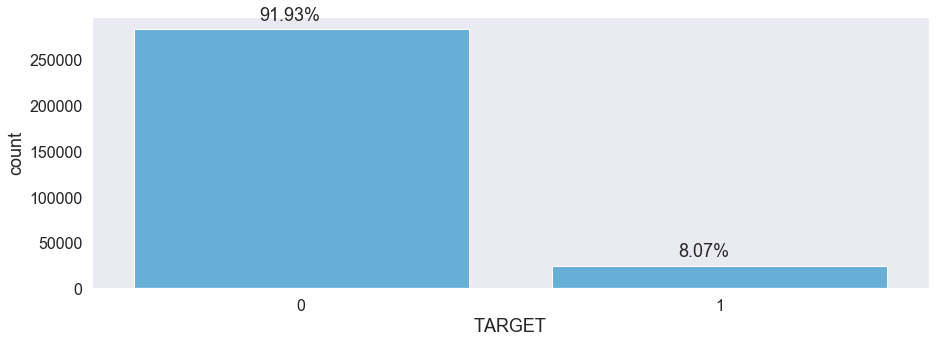

In [18]:
plt.figure(figsize=(15,5))

ax = sns.countplot('TARGET',data=application_train,color=default_color)
for p in ax.patches:
    ax.annotate('{:.2f}%'.format(100*p.get_height()/len(application_train['TARGET'])), (p.get_x()+ 0.3, p.get_height()+10000))

We can see that the data is highly unbalanced, with few DEFAULT (1) samples

---

# Meta Data analisys

In [19]:
meta_data = utils.get_meta(application_train)
meta_data

,role,level,keep,dtype
varname,,,,
SK_ID_CURR,id,nominal,False,int64
TARGET,target,binary,True,int64
NAME_CONTRACT_TYPE,input,categorical,True,object
CODE_GENDER,input,categorical,True,object
FLAG_OWN_CAR,input,binary,True,object
FLAG_OWN_REALTY,input,binary,True,object
CNT_CHILDREN,input,ordinal,True,int64
AMT_INCOME_TOTAL,input,interval,True,float64
AMT_CREDIT,input,interval,True,float64


In [20]:
meta_counts = meta_data.groupby(['role', 'level']).agg({'dtype': lambda x: x.count()}).reset_index()
meta_counts

,role,level,dtype
0,id,nominal,1
1,input,binary,29
2,input,categorical,13
3,input,interval,65
4,input,ordinal,13
5,target,binary,1


[Text(0, 0.5, 'Count'),
 Text(0.5, 0, 'Variable Type'),
 Text(0.5, 1.0, 'Variables Count Across Datatype')]

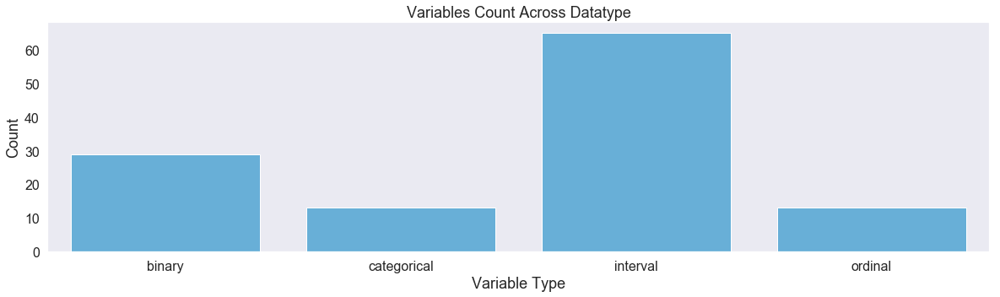

In [21]:
fig,ax = plt.subplots()
fig.set_size_inches(20,5)
sns.barplot(data=meta_counts[(meta_counts.role != 'target') & (meta_counts.role != 'id') ],x="level",y="dtype",ax=ax,color=default_color)
ax.set(xlabel='Variable Type', ylabel='Count',title="Variables Count Across Datatype")

In [22]:
#Getting the column names for each data level
col_ordinal   = meta_data[(meta_data.level == 'ordinal') & (meta_data.keep)].index
col_nominal   = meta_data[(meta_data.level == 'nominal') & (meta_data.keep)].index
col_interval = meta_data[(meta_data.level == 'interval') & (meta_data.keep)].index
col_binary    = meta_data[(meta_data.level == 'binary') & (meta_data.keep) & (meta_data.role != 'target')].index
col_categorical = meta_data[(meta_data.level == 'categorical') & (meta_data.keep)].index

#Getting all columns names, removing the ones which have "False" value for "keep"
#For later filtering purposes
all_col = []
for col in col_ordinal:
    all_col.append(col)
for col in col_nominal:
    all_col.append(col)
for col in col_interval:
    all_col.append(col)
for col in col_binary:
    all_col.append(col)
for col in col_categorical:
    all_col.append(col)
all_col.append('TARGET')

In [23]:
gc.collect()

120

# Missing values

In [24]:
missingValueColumns = application_train.columns[application_train.isnull().any()].tolist()
#Dataframe with columns which have NaNs
df_null = application_train[missingValueColumns]

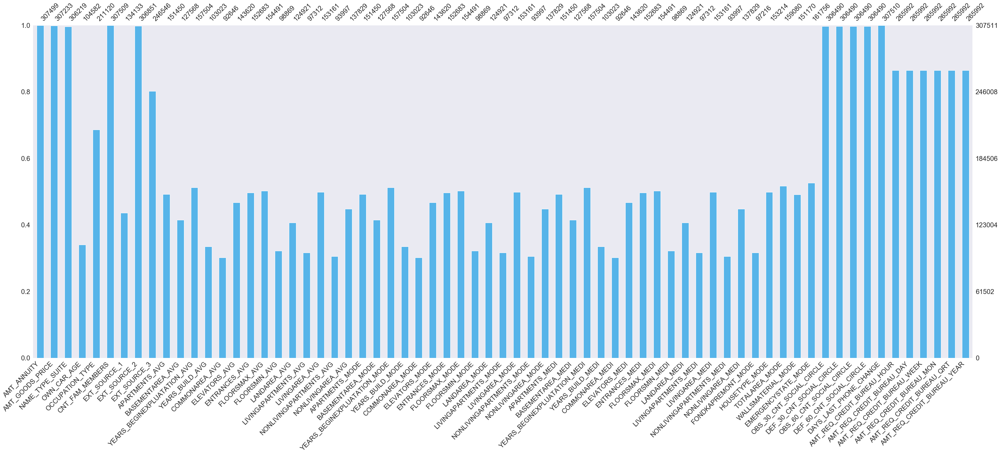

In [25]:
msno.bar(df_null,figsize=(55,20),color=default_color,fontsize=22,labels=True)

# Data Preprocessing Functions

There will be defined preprocessing functions in order to generate input data to the models. This makes the following topics (and code) more easily to be understood.

File: "**preprocessing.py**"

# Testing feature importances

### Feature importances with Random Forest

In [167]:
X, y = preprocessing.return_data_baseline_tree_nans(application_train, col_binary, col_categorical, all_col)

In [31]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier(n_estimators=150, max_depth=8, min_samples_leaf=4, max_features=0.2, n_jobs=-1, random_state=0)
rf.fit(X, y)
features = X.columns.values
print("----- Training Done -----")

In [33]:
feature_importance_rf = utils.get_feature_importance_df(rf.feature_importances_, features, top_n=40)

[Text(0, 0.5, 'Variable name'),
 Text(0.5, 0, 'Importance'),
 Text(0.5, 1.0, 'Variable importances')]

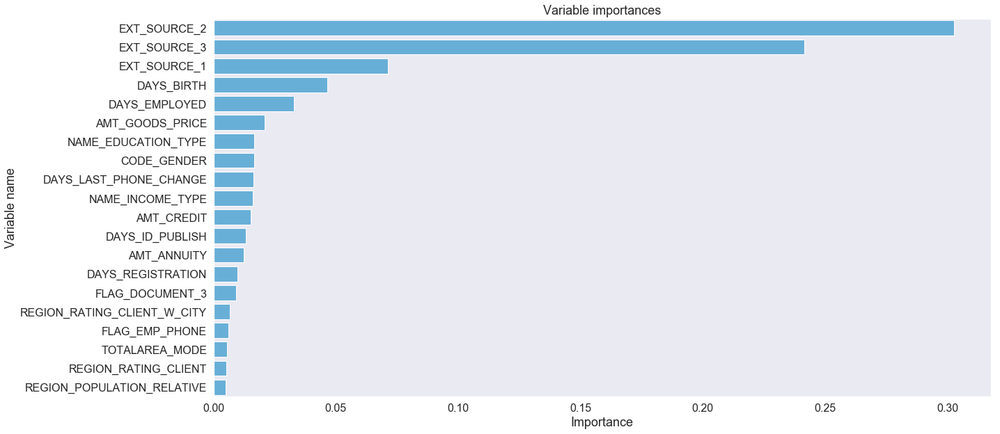

In [25]:
fig,ax = plt.subplots()
fig.set_size_inches(20,10)
sns.barplot(data=feature_importance_rf[:20],x="importance",y="feature",ax=ax,color=default_color)
ax.set(xlabel='Importance', ylabel='Variable name',title="Variable importances")

In [168]:
file_Name = output_path + "feature_importance_rf"
fileObject = open(file_Name,'wb') 
pickle.dump(feature_importance_rf,fileObject)
fileObject.close()

In [169]:
gc.collect()

7

### Feature importances with XGBoost

In [170]:
X, y = preprocessing.return_data_baseline_tree(application_train, col_binary, col_categorical, all_col)

In [259]:
# XGBoost params
xgb_params = {}
xgb_params['learning_rate'] = 0.1
xgb_params['n_estimators'] = 500
xgb_params['max_depth'] = 3
xgb_params['subsample'] = 0.9
xgb_params['colsample_bytree'] = 0.9

In [260]:
XGB_model = XGBClassifier(**xgb_params, n_jobs=4, objective='rank:pairwise')
XGB_model.fit(X, y)
features = X.columns.values
print("----- Training Done -----")

----- Training Done -----


In [349]:
#Getting all the feature importances values (120 features)
feature_importance_xgb = get_feature_importance_df(XGB_model.feature_importances_, features, top_n=120)

[Text(0, 0.5, 'Variable name'),
 Text(0.5, 0, 'Importance'),
 Text(0.5, 1.0, 'Variable importances')]

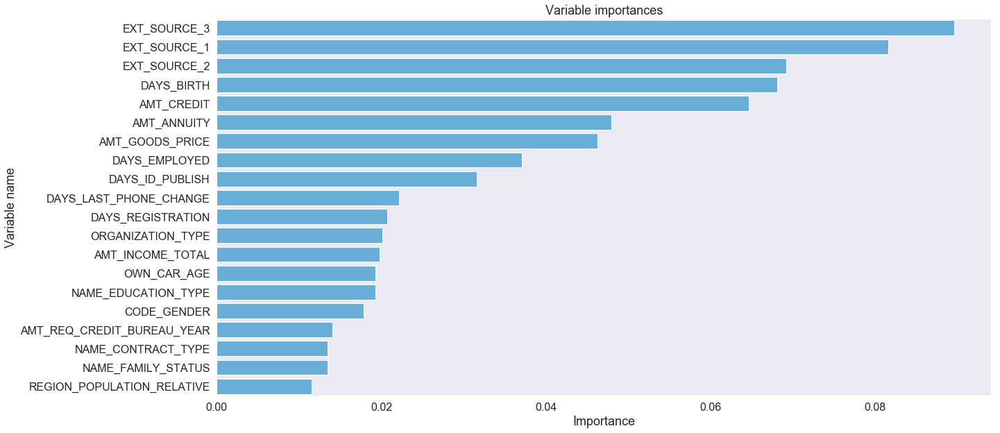

In [464]:
fig,ax = plt.subplots()
fig.set_size_inches(20,10)
sns.barplot(data=feature_importance_xgb[:20],x="importance",y="feature",ax=ax,color=default_color)
ax.set(xlabel='Importance', ylabel='Variable name',title="Variable importances")

In [171]:
file_Name = output_path + "feature_importance_xgb"
fileObject = open(file_Name,'wb') 
pickle.dump(feature_importance_xgb,fileObject)
fileObject.close()

In [172]:
gc.collect()

7

### Comparing Importances: RandomForest vs XGBoost

In [173]:
features_order = pd.DataFrame(pd.concat([feature_importance_rf.feature, feature_importance_xgb.feature], axis=1))

In [174]:
features_order.head(10)

,feature,feature
0,EXT_SOURCE_2,EXT_SOURCE_3
1,EXT_SOURCE_3,EXT_SOURCE_1
2,EXT_SOURCE_1,EXT_SOURCE_2
3,DAYS_BIRTH,DAYS_BIRTH
4,DAYS_EMPLOYED,AMT_CREDIT
5,AMT_GOODS_PRICE,AMT_ANNUITY
6,NAME_EDUCATION_TYPE,AMT_GOODS_PRICE
7,CODE_GENDER,DAYS_EMPLOYED
8,DAYS_LAST_PHONE_CHANGE,DAYS_ID_PUBLISH
9,NAME_INCOME_TYPE,DAYS_LAST_PHONE_CHANGE


---

# Baseline models

## Dummy/Naive Classifier

In [175]:
X, y = preprocessing.return_data_dummy_classifier(application_train)

In [176]:
dummy = DummyClassifier(strategy='prior')

In [177]:
cross_score = evaluation.cross_val_model(X, y, dummy, use_random_state=True)

In [178]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.5 0.5 0.5]
Mean cross_score: 0.50000


The AUC ROC is 0.5, as expected.

In [179]:
gc.collect()

6

## Tree-based models

#### Random Forest Model

In [39]:
#RandomForest params
rf_params = {}
rf_params['n_estimators'] = 200
rf_params['max_depth'] = 6
rf_params['min_samples_split'] = 70
rf_params['min_samples_leaf'] = 30
rf_params['n_jobs'] = -1

In [40]:
rf_model = RandomForestClassifier(**rf_params)

In [46]:
X, y = preprocessing.return_data_baseline_tree_nans(application_train, col_binary, col_categorical, all_col)

In [42]:
cross_score = evaluation.cross_val_model(X, y, rf_model, use_random_state=True)

In [43]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.72281567 0.72051501 0.72400436]
Mean cross_score: 0.72245


In [47]:
gc.collect()

21

#### XGBoost Model

In [87]:
# XGBoost params
xgb_params = {}
xgb_params['learning_rate'] = 0.1
xgb_params['n_estimators'] = 500
xgb_params['objective'] = 'rank:pairwise'
xgb_params['n_jobs'] = 4
xgb_params['max_depth'] = 5
xgb_params['min_child_weight'] = 1
xgb_params['gamma'] = 0
xgb_params['subsample'] = 0.8
xgb_params['colsample_bytree'] = 0.8
xgb_params['scale_pos_weight'] = 1
xgb_params['random_state'] = 10

In [88]:
XGB_model = XGBClassifier(**xgb_params)

In [89]:
X, y = preprocessing.return_data_baseline_tree(application_train, col_binary, col_categorical, all_col)

In [183]:
cross_score = evaluation.cross_val_model(X, y, XGB_model, use_random_state=True)

In [184]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75654442 0.75266023 0.7595153 ]
Mean cross_score: 0.75624


In [90]:
gc.collect()

6518

Generating the predictions for the customers in **application_test.csv** using the baseline model. We are going to make a submission to Kaggle. We will use this later for comparing with the final model.

In [91]:
XGB_model.fit(X, y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=None, n_estimators=500,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)

In [112]:
gc.collect()

419

Import the test (submission) dataset:

In [93]:
application_test = pd.read_csv(path + 'application_test.csv')

In [105]:
X_sub = preprocessing.return_test_data_baseline_tree(application_test, col_binary, col_categorical, np.delete(all_col, [120]))

In [115]:
sub_prob_preds = utils.sigmoid(XGB_model.predict_proba(X_sub)[:,1])

In [116]:
sub = pd.DataFrame()
sub['SK_ID_CURR'] = application_test["SK_ID_CURR"]
sub['TARGET'] = sub_prob_preds
sub.to_csv(output_path + 'baseline_prediction.csv', index=False)

In [118]:
del application_test

## Non tree-based models

#### Logistic Regression

In [186]:
lr_params = {}
lr_params['penalty'] = 'l2'
lr_params['solver'] = 'liblinear'
lr_params['class_weight'] = 'balanced'
lr_params['n_jobs'] = -1
lr_params['random_state'] = 10

In [187]:
lr_model = LogisticRegression(**lr_params)

In [188]:
X, y = preprocessing.return_data_baseline_linear(application_train, col_binary, col_categorical, all_col)

In [189]:
cross_score = evaluation.cross_val_model(X, y, lr_model, use_random_state=True)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:1300: UserWarning: 'n_jobs' > 1 does not have any effect when 'solver' is set to 'liblinear'. Got 'n_jobs' = 4.
  " = {}.".format(effective_n_jobs(self.n_jobs)))
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\svm\base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:1300: UserWarning: 'n_jobs' > 1 does not

In [190]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.63846502 0.63793018 0.63158483]
Mean cross_score: 0.63599


In [191]:
gc.collect()

34

# First Method for EDA

First, we are going to select some features with a Feature Selection algorithm and then try to dive deep into the data for Exploratory Data Analysis. This is a first approach in order to select some features.

XGBoost Feature Importances -> EDA

In [53]:
#First 10 features
eda_features = feature_importance_xgb[:10].feature.values

#### First Feature: EXT_SOURCE_3

In [54]:
feature = eda_features[0]

In [55]:
application_train[feature].describe()

count   246546.00
mean         0.51
std          0.19
min          0.00
25%          0.37
50%          0.54
75%          0.67
max          0.90
Name: EXT_SOURCE_3, dtype: float64

In [56]:
#NaNs
application_train[feature].isna().value_counts()

False    246546
True      60965
Name: EXT_SOURCE_3, dtype: int64

In [57]:
percentage_nans = application_train[feature].isna().value_counts()[1]/(application_train[feature].isna().value_counts()[0]+application_train[feature].isna().value_counts()[1])
print("Percentage of NaNs: {:.2f}%".format(percentage_nans*100))

Percentage of NaNs: 19.83%


In [58]:
nans = application_train[application_train[feature].isna()]
non_nans = application_train[application_train[feature].notnull()]
print('The non-NaNs default on %0.2f%% of loans' % (100 * non_nans['TARGET'].mean()))
print('The NaNs default on %0.2f%% of loans' % (100 * nans['TARGET'].mean()))
print('There are %d NaNs samples' % len(nans))

The non-NaNs default on 7.77% of loans
The NaNs default on 9.31% of loans
There are 60965 NaNs samples


In [59]:
#Getting the indexes of finite numbers (inverse of NaNs)
index = application_train[feature].index[application_train[feature].apply(np.isfinite)]

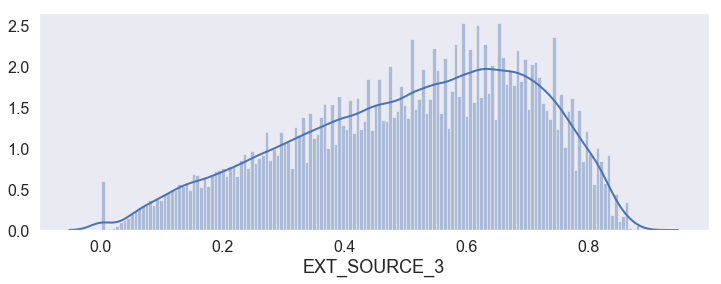

In [60]:
fig = plt.figure(figsize=(12,4))
ax = sns.distplot(application_train[feature].loc[index], bins=150)

Are the values near zero, really zero?
We can't see the exact values from the plot above.

In [61]:
application_train[application_train[feature]<=0.01][feature].value_counts().keys()

Float64Index([0.0005272652387098817], dtype='float64')

They are not exactly zero. They have **0.0005272652387098817** value.

In [62]:
anom = application_train[application_train[feature]<=0.01]
non_anom = application_train[application_train[feature]>0.01]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous' % len(anom))

The non-anomalies default on 7.73% of loans
The anomalies default on 17.04% of loans
There are 886 anomalous


As we can see, there is a high percentage of default within these values, as opposed to the rest of the samples.

**NaNs** - High percentage of NaNs, and the default distribution is slightly different for NaNs. This can be considered for feature engineering.

**Outliers** - No outliers.

The values equal 0.0005272652387098817 have a high frequency. This could be:
> Part of the NaNs were filled with the equivalent 0.0005272652387098817 number before the standardization.

> The distribution was clipped between 0 and 1, thus removing the values lower than zero

Moreover, these values have a high percentage of default. This could be considered for feature engineering. However, we are not considering this for feature engineering because the number of samples is low (886 samples).

#### Second Feature: EXT_SOURCE_1

In [63]:
feature = eda_features[1]

In [64]:
application_train[feature].describe()

count   134133.00
mean         0.50
std          0.21
min          0.01
25%          0.33
50%          0.51
75%          0.68
max          0.96
Name: EXT_SOURCE_1, dtype: float64

In [65]:
#NaNs
application_train[feature].isna().value_counts()

True     173378
False    134133
Name: EXT_SOURCE_1, dtype: int64

In [66]:
percentage_nans = application_train[feature].isna().value_counts()[1]/(application_train[feature].isna().value_counts()[0]+application_train[feature].isna().value_counts()[1])
print("Percentage of NaNs: {:.2f}%".format(percentage_nans*100))

Percentage of NaNs: 56.38%


In [67]:
nans = application_train[application_train[feature].isna()]
non_nans = application_train[application_train[feature].notnull()]
print('The non-NaNs default on %0.2f%% of loans' % (100 * non_nans['TARGET'].mean()))
print('The NaNs default on %0.2f%% of loans' % (100 * nans['TARGET'].mean()))
print('There are %d NaNs samples' % len(nans))

The non-NaNs default on 7.50% of loans
The NaNs default on 8.52% of loans
There are 173378 NaNs samples


In [68]:
#Getting the indexes of finite numbers (inverse of NaNs)
index = application_train[feature].index[application_train[feature].apply(np.isfinite)]

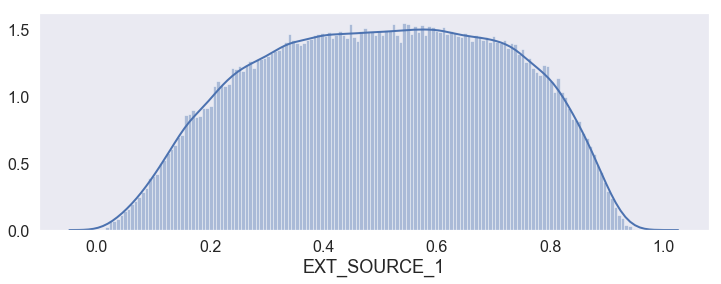

In [69]:
fig = plt.figure(figsize=(12,4))
ax = sns.distplot(application_train[feature].loc[index], bins=150)

**NaNs** - High percentage of NaNs, and the default distribution is slightly different for NaNs. This can be considered for feature engineering.

**Outliers** - No outliers.

#### Third Feature: EXT_SOURCE_2

In [70]:
feature = eda_features[2]

In [71]:
application_train[feature].describe()

count   306851.00
mean         0.51
std          0.19
min          0.00
25%          0.39
50%          0.57
75%          0.66
max          0.85
Name: EXT_SOURCE_2, dtype: float64

In [72]:
#NaNs
application_train[feature].isna().value_counts()

False    306851
True        660
Name: EXT_SOURCE_2, dtype: int64

In [73]:
percentage_nans = application_train[feature].isna().value_counts()[1]/(application_train[feature].isna().value_counts()[0]+application_train[feature].isna().value_counts()[1])
print("Percentage of NaNs: {:.2f}%".format(percentage_nans*100))

Percentage of NaNs: 0.21%


In [74]:
nans = application_train[application_train[feature].isna()]
non_nans = application_train[application_train[feature].notnull()]
print('The non-NaNs default on %0.2f%% of loans' % (100 * non_nans['TARGET'].mean()))
print('The NaNs default on %0.2f%% of loans' % (100 * nans['TARGET'].mean()))
print('There are %d NaNs samples' % len(nans))

The non-NaNs default on 8.07% of loans
The NaNs default on 7.88% of loans
There are 660 NaNs samples


In [75]:
#Getting the indexes of finite numbers (inverse of NaNs)
index = application_train[feature].index[application_train[feature].apply(np.isfinite)]

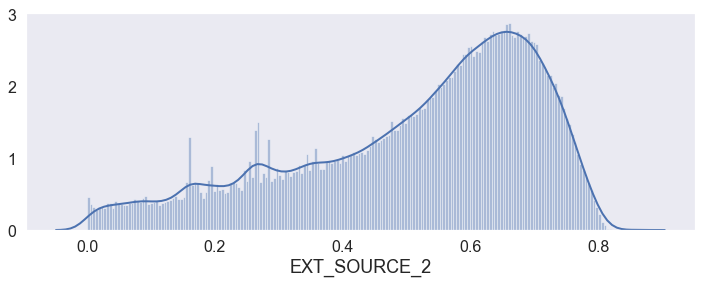

In [76]:
fig = plt.figure(figsize=(12,4))
ax = sns.distplot(application_train[feature].loc[index], bins=200)

In [77]:
gc.collect()

21234

**NaNs** - Low percentage of NaNs.

**Outliers** - No outliers.

#### Fourth Feature: DAYS_BIRTH

In [78]:
feature = eda_features[3]

In [79]:
application_train[feature].describe()

count   307511.00
mean    -16037.00
std       4363.99
min     -25229.00
25%     -19682.00
50%     -15750.00
75%     -12413.00
max      -7489.00
Name: DAYS_BIRTH, dtype: float64

As we can see, the values are negative. This is because the values are relative to the application.

In [80]:
years_birth = pd.DataFrame((application_train[feature].values / -365), columns=['YEARS_BIRTH'] )

In [81]:
years_birth.describe()

,YEARS_BIRTH
count,307511.00
mean,43.94
std,11.96
min,20.52
25%,34.01
50%,43.15
75%,53.92
max,69.12


In [82]:
years_birth.head()

,YEARS_BIRTH
0,25.92
1,45.93
2,52.18
3,52.07
4,54.61


In [83]:
#NaNs
application_train[feature].isna().value_counts()

False    307511
Name: DAYS_BIRTH, dtype: int64

There aren't NaNs

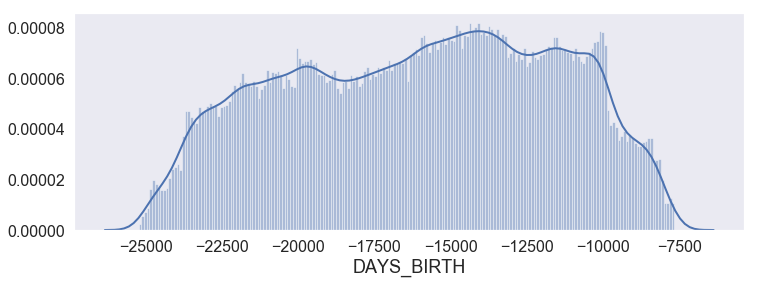

In [84]:
fig = plt.figure(figsize=(12,4))
ax = sns.distplot(application_train[feature], bins=200)

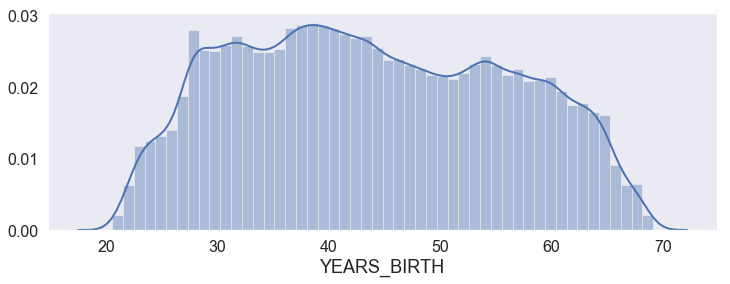

In [85]:
fig = plt.figure(figsize=(12,4))
ax = sns.distplot(years_birth, bins=50, axlabel='YEARS_BIRTH')

In [86]:
gc.collect()

26688

**NaNs** - Zero NaNs.

**Outliers** - No outliers.

#### Fifth Feature: AMT_CREDIT

In [87]:
feature = eda_features[4]

In [88]:
application_train[feature].describe()

count    307511.00
mean     599026.00
std      402490.78
min       45000.00
25%      270000.00
50%      513531.00
75%      808650.00
max     4050000.00
Name: AMT_CREDIT, dtype: float64

In [89]:
#NaNs
application_train[feature].isna().value_counts()

False    307511
Name: AMT_CREDIT, dtype: int64

There aren't NaNs

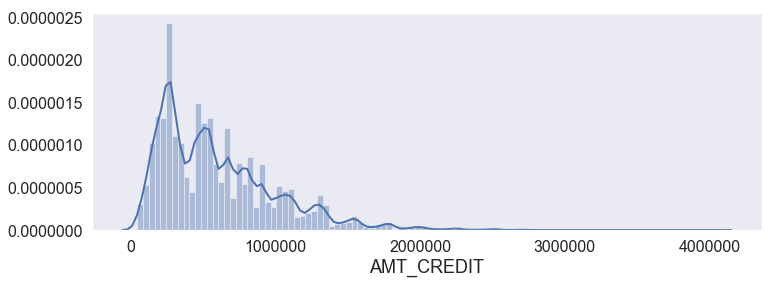

In [90]:
fig = plt.figure(figsize=(12,4))
ax = sns.distplot(application_train[feature], bins=100)

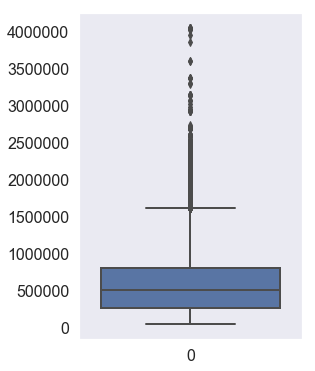

In [91]:
fig = plt.figure(figsize=(4,6))
ax = sns.boxplot(data=application_train[feature])

As we can see, there are extreme values. This feature indicates the credit amount of the loan, so maybe these extreme values have information about the default risk.

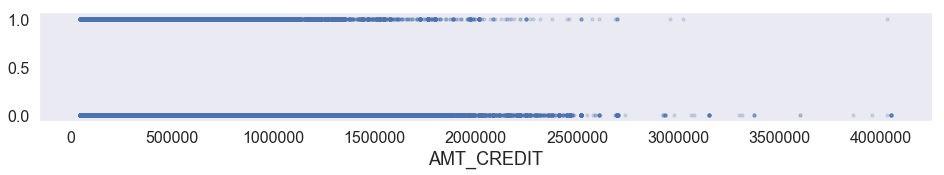

In [92]:
fig = plt.figure(figsize=(16,2))
plt.scatter(application_train[feature], np.zeros_like(application_train[feature]) + application_train.TARGET, alpha = 0.2, s=10)
plt.xlabel(feature)
plt.show()

The following plot shows us the default distribution for high values of AMT_CREDIT. The threshold was set according to Tukey's |Method for outliers detection in 1 dimension.

Obs: log transform for better visualization.

In [93]:
quantiles = application_train[feature].quantile([0.25,0.75])
IQR = quantiles.iloc[1]-quantiles.iloc[0]
threshold = 1.5*IQR+quantiles.iloc[1]

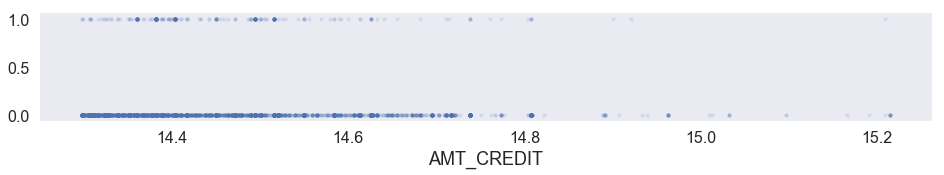

In [94]:
fig = plt.figure(figsize=(16,2))
plt.scatter(np.log(application_train[feature][application_train[feature]>threshold]), np.zeros_like(application_train[feature][application_train[feature]>threshold]) + application_train.TARGET[application_train[feature]>threshold], alpha = 0.1, s=10)
plt.xlabel(feature)
plt.show()

As we can see, the default risk is low for high values of AMT_CREDIT. This feature could have information on extreme values.

In [95]:
anom = application_train[application_train[feature] > threshold]
non_anom = application_train[application_train[feature] <= threshold]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous AMT_CREDIT' % len(anom))

The non-anomalies default on 8.16% of loans
The anomalies default on 4.11% of loans
There are 6562 anomalous AMT_CREDIT


In [96]:
gc.collect()

15340

**NaNs** - Zero NaNs.

**Outliers** - there are extreme values, and their default distribution is different from the rest of the data. We can proceed with the following options:

> Use all the data

> Replace the outliers with a specific number (mean, median, mode) or NaN and generate a boolean column indicating whether or not the value was extreme

> Use all the data and generate a boolean column indicating whether or not the value was extreme

#### Sixth Feature: AMT_ANNUITY

In [97]:
feature = eda_features[5]

In [98]:
application_train[feature].describe()

count   307499.00
mean     27108.57
std      14493.74
min       1615.50
25%      16524.00
50%      24903.00
75%      34596.00
max     258025.50
Name: AMT_ANNUITY, dtype: float64

In [99]:
#NaNs
application_train[feature].isna().value_counts()

False    307499
True         12
Name: AMT_ANNUITY, dtype: int64

In [100]:
percentage_nans = application_train[feature].isna().value_counts()[1]/(application_train[feature].isna().value_counts()[0]+application_train[feature].isna().value_counts()[1])
print("Number of NaNs: {:.3f}%".format(percentage_nans*100))

Number of NaNs: 0.004%


In [101]:
#Getting the indexes of finite numbers (inverse of NaNs)
index = application_train[feature].index[application_train[feature].apply(np.isfinite)]

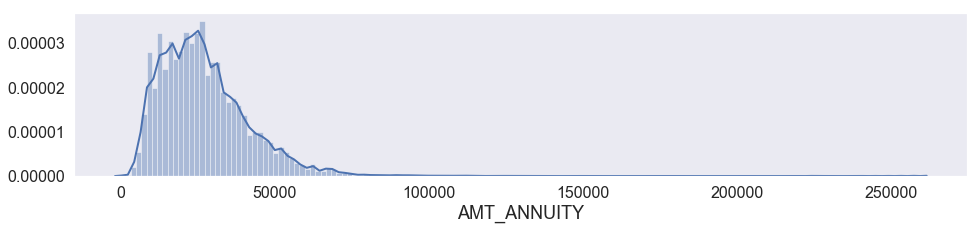

In [102]:
fig = plt.figure(figsize=(16,3))
ax = sns.distplot(application_train[feature].loc[index], bins=150)

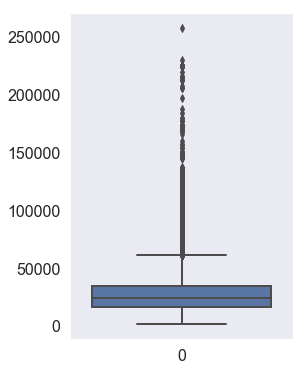

In [103]:
fig = plt.figure(figsize=(4,6))
ax = sns.boxplot(data=application_train[feature])

As we can see, there are extreme values.

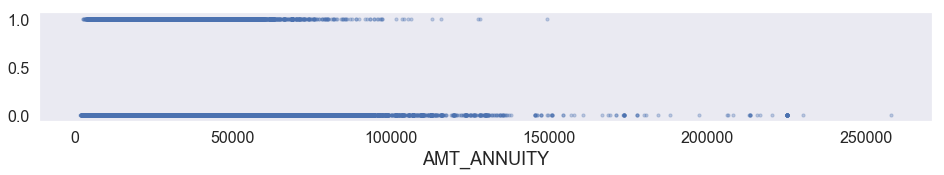

In [104]:
fig = plt.figure(figsize=(16,2))
plt.scatter(application_train[feature], np.zeros_like(application_train[feature]) + application_train.TARGET, alpha = 0.3, s=10)
plt.xlabel(feature)
plt.show()

The following plot shows us the default distribution for high values of AMT_ANNUITY. The threshold was set according to Tukey's Method for outliers detection in 1 dimension.

Obs: log transform for better visualization.

In [105]:
quantiles = application_train[feature].quantile([0.25,0.75])
IQR = quantiles.iloc[1]-quantiles.iloc[0]
threshold = 1.5*IQR+quantiles.iloc[1]

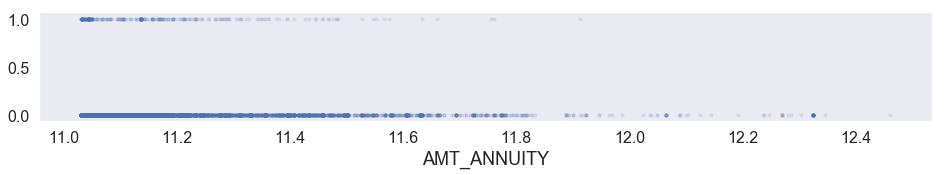

In [106]:
fig = plt.figure(figsize=(16,2))
plt.scatter(np.log(application_train[feature][application_train[feature]>threshold]), np.zeros_like(application_train[feature][application_train[feature]>threshold]) + application_train.TARGET[application_train[feature]>threshold], alpha = 0.1, s=10)
plt.xlabel(feature)
plt.show()

As we can see, the default risk is low for high values of AMT_ANNUITY. This feature could have information on extreme values.

In [107]:
anom = application_train[application_train[feature] > threshold]
non_anom = application_train[application_train[feature] <= threshold]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous' % len(anom))

The non-anomalies default on 8.17% of loans
The anomalies default on 4.12% of loans
There are 7504 anomalous


The analysis above could indicate that the features AMT_CREDIT and AMT_ANNUITY have some correlation. Moreover, by the business point of view, the amount of annuity is calculated based on the amount of credit and the interest rates.

In [108]:
corr_columns = ['AMT_CREDIT', 'AMT_ANNUITY']

Pearson correlation:

In [109]:
application_train[corr_columns].corr(method='pearson')

,AMT_CREDIT,AMT_ANNUITY
AMT_CREDIT,1.00,0.77
AMT_ANNUITY,0.77,1.00


Spearman correlation (rank):

In [110]:
application_train[corr_columns].corr(method='spearman')

,AMT_CREDIT,AMT_ANNUITY
AMT_CREDIT,1.00,0.83
AMT_ANNUITY,0.83,1.00


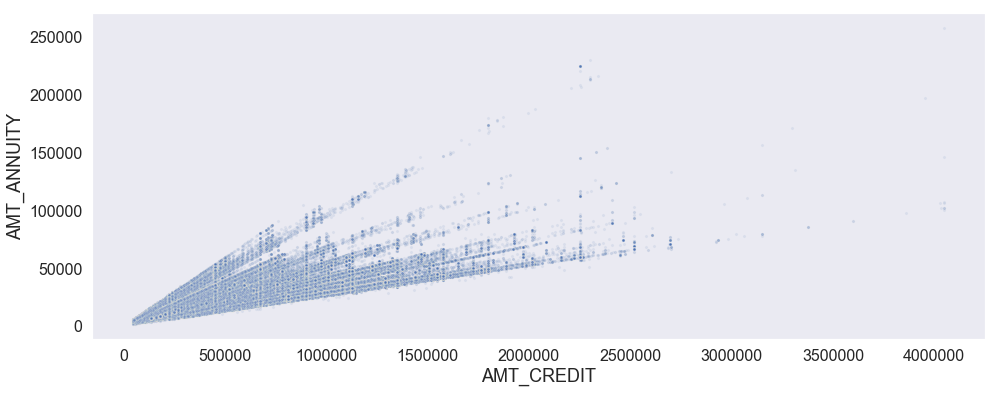

In [111]:
fig = plt.figure(figsize=(16,6))
sns.scatterplot(x='AMT_CREDIT', y='AMT_ANNUITY',data=application_train, alpha=0.1, s=10)

The line shapes of the plot above shows us that indeed the 2 features are linear combination of each other. The parameters (interest rate, for example) are dependent of each type of customer, and this gives us the several lines on the plot.

**NaNs** - Very low percentage of NaNs. Only 12 objects. These objects could be imputed using the correlation from the AMT_CREDIT feature, but in this case, the benefit would be minimal.

**Correlation** - there is a strong correlation between the AMT_CREDIT and AMT_ANNUITY features. For linear models, this could be taken into account for feature engineering. This is not the case for tree based models.

**Outliers** - There are extreme values, as the AMT_CREDIT feature.

> Use all the data

> Replace the outliers with a specific number (mean, median, mode) or NaN and generate a boolean column indicating whether or not the value was extreme

> Use all the data and generate a boolean column indicating whether or not the value was extreme

In [112]:
gc.collect()

19678

#### Seventh Feature: AMT_GOODS_PRICE

In [113]:
feature = eda_features[6]

In [114]:
application_train[feature].describe()

count    307233.00
mean     538396.21
std      369446.46
min       40500.00
25%      238500.00
50%      450000.00
75%      679500.00
max     4050000.00
Name: AMT_GOODS_PRICE, dtype: float64

In [115]:
#NaNs
application_train[feature].isna().value_counts()

False    307233
True        278
Name: AMT_GOODS_PRICE, dtype: int64

In [116]:
percentage_nans = application_train[feature].isna().value_counts()[1]/(application_train[feature].isna().value_counts()[0]+application_train[feature].isna().value_counts()[1])
print("Percentage of NaNs: {:.2f}%".format(percentage_nans*100))

Percentage of NaNs: 0.09%


In [117]:
nans = application_train[application_train[feature].isna()]
non_nans = application_train[application_train[feature].notnull()]
print('The non-NaNs default on %0.2f%% of loans' % (100 * non_nans['TARGET'].mean()))
print('The NaNs default on %0.2f%% of loans' % (100 * nans['TARGET'].mean()))
print('There are %d NaNs samples' % len(nans))

The non-NaNs default on 8.07% of loans
The NaNs default on 7.55% of loans
There are 278 NaNs samples


In [118]:
#Getting the indexes of finite numbers (inverse of NaNs)
index = application_train[feature].index[application_train[feature].apply(np.isfinite)]

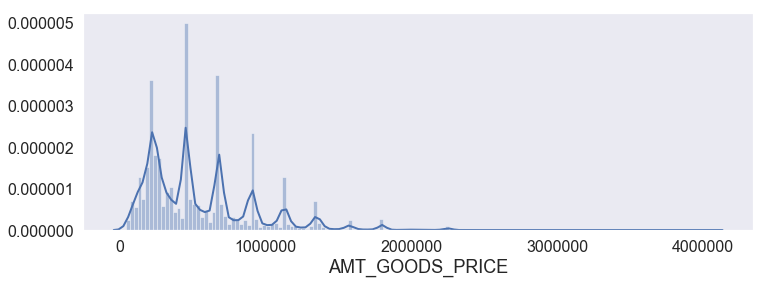

In [119]:
fig = plt.figure(figsize=(12,4))
ax = sns.distplot(application_train[feature].loc[index], bins=150)

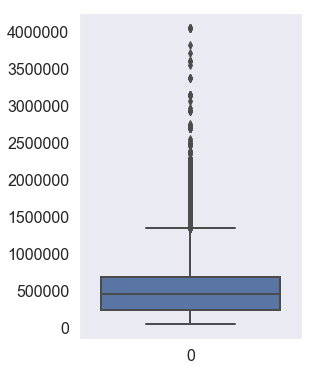

In [120]:
fig = plt.figure(figsize=(4,6))
ax = sns.boxplot(data=application_train[feature])

As we can see, there are extreme values.

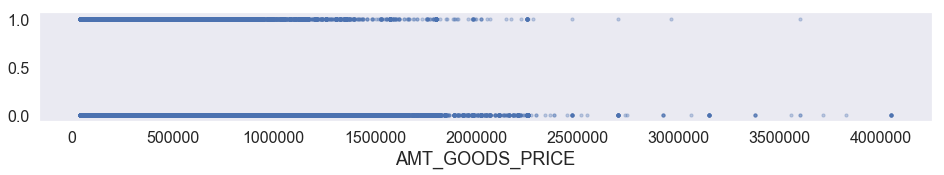

In [121]:
fig = plt.figure(figsize=(16,2))
plt.scatter(application_train[feature], np.zeros_like(application_train[feature]) + application_train.TARGET, alpha = 0.3, s=10)
plt.xlabel(feature)
plt.show()

The following plot shows us the default distribution for high values of AMT_GOODS_PRICE. The threshold was set according to Tukey's Method for outliers detection in 1 dimension.

Obs: log transform for better visualization.

In [122]:
quantiles = application_train[feature].quantile([0.25,0.75])
IQR = quantiles.iloc[1]-quantiles.iloc[0]
threshold = 1.5*IQR+quantiles.iloc[1]

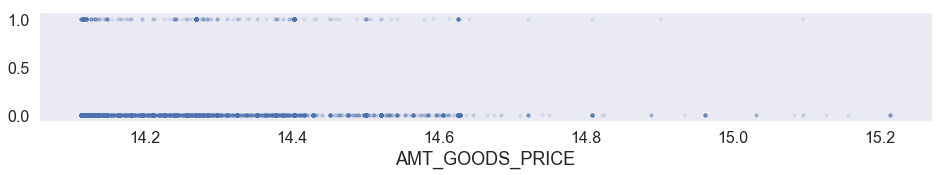

In [123]:
fig = plt.figure(figsize=(16,2))
plt.scatter(np.log(application_train[feature][application_train[feature]>threshold]), np.zeros_like(application_train[feature][application_train[feature]>threshold]) + application_train.TARGET[application_train[feature]>threshold], alpha = 0.1, s=10)
plt.xlabel(feature)
plt.show()

As we can see, the default risk is low for high values of AMT_GOODS_PRICE. This feature could have information on extreme values.

In [124]:
anom = application_train[application_train[feature] > threshold]
non_anom = application_train[application_train[feature] <= threshold]
print('The non-anomalies default on %0.2f%% of loans' % (100 * non_anom['TARGET'].mean()))
print('The anomalies default on %0.2f%% of loans' % (100 * anom['TARGET'].mean()))
print('There are %d anomalous' % len(anom))

The non-anomalies default on 8.27% of loans
The anomalies default on 4.09% of loans
There are 14728 anomalous


**NaNs** - Low percentage of NaNs.

**Outliers** - there are extreme values, and their default distribution is different from the rest of the data. We can proceed with the following options:

> Use all the data

> Replace the outliers with a specific number (mean, median, mode) or NaN and generate a boolean column indicating whether or not the value was extreme

> Use all the data and generate a boolean column indicating whether or not the value was extreme

# Feature Engineering

## Testing the impact of removing unimportant features:

Template code for experiment (the complete runs were removed for simplicity):

In [140]:
# XGBoost params
xgb_params = {}
xgb_params['learning_rate'] = 0.1
xgb_params['n_estimators'] = 500
xgb_params['objective'] = 'rank:pairwise'
xgb_params['n_jobs'] = 4
xgb_params['max_depth'] = 5
xgb_params['min_child_weight'] = 1
xgb_params['gamma'] = 0
xgb_params['subsample'] = 0.8
xgb_params['colsample_bytree'] = 0.8
xgb_params['scale_pos_weight'] = 1
xgb_params['random_state'] = 10

In [141]:
XGB_model = XGBClassifier(**xgb_params)

In [262]:
#Preprocessing considering only n important features
n_important_features = 40
col_binary_reduced, col_categorical_reduced, all_columns_reduced = utils.get_reduced_important_columns(feature_importance_xgb.feature[:n_important_features].values, col_binary, col_categorical)
#Features which we want a "feature"_NAN column:
#list_nan_features = ["EXT_SOURCE_3"]
#Features which we want a "feature"_IS_ANOM column:
#list_anom_features = ["AMT_ANNUITY"]
X, y = preprocessing.return_data_tree(application_train, col_binary_reduced, col_categorical_reduced, all_columns_reduced, new_nan_features=list_nan_features)

In [143]:
cross_score = evaluation.cross_val_model(X, y, XGB_model, use_random_state=True)

In [144]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75928768 0.75352727 0.7592095 ]
Mean cross_score: 0.75734


In [145]:
gc.collect()

15645

### Experiment:
Cross val XGB with only important features. Does the score goes up?

#### Results:

6 important features:

In [196]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.73901287 0.73339048 0.74111273]
Mean cross_score: 0.73784


10 important features:

In [202]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.74583663 0.74368159 0.75034866]
Mean cross_score: 0.74662


20 important features:

In [208]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75545365 0.75254123 0.7591305 ]
Mean cross_score: 0.75571


40 important features:

In [214]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75928768 0.75352727 0.7592095 ]
Mean cross_score: 0.75734


40 important features plus EXT_SOURCE_3_NAN

In [265]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.7580611  0.75360049 0.76089541]
Mean cross_score: 0.75752


40 important features plus AMT_ANNUITY_IS_ANOM

In [305]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.7590274  0.7541832  0.76005218]
Mean cross_score: 0.75775


60 important features:

In [239]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75686671 0.75221049 0.75928009]
Mean cross_score: 0.75612


80 important features:

In [245]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75700251 0.75256538 0.75916569]
Mean cross_score: 0.75624


102 important features (that have a positive importance value):

In [258]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.7571421  0.75299974 0.75937974]
Mean cross_score: 0.75651


Baseline model (all features):

In [184]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75654442 0.75266023 0.7595153 ]
Mean cross_score: 0.75624


All features plus EXT_SOURCE_3_NAN

In [279]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75756005 0.7530334  0.75882949]
Mean cross_score: 0.75647


#### First Feature: EXT_SOURCE_3

In [282]:
feature = eda_features[0]

Testing the impact of including EXT_SOURCE_3_NAN, and removing unimportant features:

In [283]:
XGB_model = XGBClassifier(**xgb_params)

In [284]:
#Preprocessing considering only n important features
n_important_features = 40
col_binary_reduced, col_categorical_reduced, all_columns_reduced = utils.get_reduced_important_columns(feature_importance_xgb.feature[:n_important_features].values, col_binary, col_categorical)
#Features which we want a "feature"_NAN column:
list_nan_features = [feature]
#Features which we want a "feature"_IS_K column:
#In this case, we are not considering, as explained in the EDA session:
#list_is_k_features = [feature]
X, y = preprocessing.return_data_tree(application_train, col_binary_reduced, col_categorical_reduced, all_columns_reduced, list_nan_features)

In [286]:
cross_score = evaluation.cross_val_model(X, y, XGB_model, use_random_state=True)

In [287]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.7580611  0.75360049 0.76089541]
Mean cross_score: 0.75752


In [288]:
gc.collect()

242

#### Second Feature: EXT_SOURCE_1

In [289]:
feature = eda_features[1]

In [290]:
XGB_model = XGBClassifier(**xgb_params)

Testing the impact of including EXT_SOURCE_1_NAN, and removing unimportant features:

In [291]:
#Preprocessing considering only n important features
n_important_features = 40
col_binary_reduced, col_categorical_reduced, all_columns_reduced = utils.get_reduced_important_columns(feature_importance_xgb.feature[:n_important_features].values, col_binary, col_categorical)
#Features which we want a "feature"_NAN column:
list_nan_features = [feature]
X, y = preprocessing.return_data_tree(application_train, col_binary_reduced, col_categorical_reduced, all_columns_reduced, list_nan_features)

In [292]:
cross_score = evaluation.cross_val_model(X, y, XGB_model, use_random_state=True)

In [293]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75797497 0.75391889 0.75981841]
Mean cross_score: 0.75724


In [294]:
gc.collect()

27

The score went down. Let's check the feature importances for the 40 most important features plus EXT_SOURCE_3_NAN and EXT_SOURCE_1_NAN:

In [85]:
#Preprocessing considering only n important features
n_important_features = 40
col_binary_reduced, col_categorical_reduced, all_columns_reduced = utils.get_reduced_important_columns(feature_importance_xgb.feature[:n_important_features].values, col_binary, col_categorical)
#Features which we want a "feature"_NAN column:
list_nan_features = [eda_features[0], eda_features[1]]
X, y = preprocessing.return_data_tree(application_train, col_binary_reduced, col_categorical_reduced, all_columns_reduced, list_nan_features)

In [91]:
XGB_model = XGBClassifier(**xgb_params)
XGB_model.fit(X, y)
features = X.columns.values
print("----- Training Done -----")

----- Training Done -----


In [103]:
feature_importance_xgb_test = utils.get_feature_importance_df(XGB_model.feature_importances_, features, top_n=50)

In [112]:
feature_importance_xgb_test['importance'][feature_importance_xgb_test.feature==(feature+"_NAN")].values

array([0.])

The importance value for EXT_SOURCE_1_NAN is zero. So, we are not considering it for feature engineering.

In [179]:
gc.collect()

122

#### Fifth Feature: AMT_CREDIT

In [295]:
feature = eda_features[4]

Testing the impact of including AMT_CREDIT_IS_ANOM, and removing unimportant features:

In [296]:
XGB_model = XGBClassifier(**xgb_params)

In [297]:
#Preprocessing considering only n important features
n_important_features = 40
col_binary_reduced, col_categorical_reduced, all_columns_reduced = utils.get_reduced_important_columns(feature_importance_xgb.feature[:n_important_features].values, col_binary, col_categorical)
#Features which we want a "feature"_IS_ANOM column:
list_anom_features = [feature]
X, y = preprocessing.return_data_tree(application_train, col_binary_reduced, col_categorical_reduced, all_columns_reduced, new_is_anom_features=list_anom_features)

In [298]:
cross_score = evaluation.cross_val_model(X, y, XGB_model, use_random_state=True)

In [299]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75796627 0.75382009 0.75962636]
Mean cross_score: 0.75714


In [300]:
gc.collect()

27

The score went down. Let's check the feature importances for the 40 most important features plus EXT_SOURCE_3_NAN and AMT_CREDIT_IS_ANOM:

In [171]:
#Preprocessing considering only n important features
n_important_features = 40
col_binary_reduced, col_categorical_reduced, all_columns_reduced = utils.get_reduced_important_columns(feature_importance_xgb.feature[:n_important_features].values, col_binary, col_categorical)
#Features which we want a "feature"_NAN column:
list_nan_features = [eda_features[0]]
#Features which we want a "feature"_IS_ANOM column:
list_anom_features = [feature]
X, y = preprocessing.return_data_tree(application_train, col_binary_reduced, col_categorical_reduced, all_columns_reduced, new_nan_features=list_nan_features, new_is_anom_features=list_anom_features)

In [173]:
XGB_model = XGBClassifier(**xgb_params)
XGB_model.fit(X, y)
features = X.columns.values
print("----- Training Done -----")

----- Training Done -----


In [174]:
feature_importance_xgb_test = utils.get_feature_importance_df(XGB_model.feature_importances_, features, top_n=50)

In [175]:
feature_importance_xgb_test['importance'][feature_importance_xgb_test.feature==(feature+"_IS_ANOM")].values

array([0.])

The importance value for AMT_CREDIT_IS_ANOM is zero. So, we are not considering it for feature engineering.

#### Sixth Feature: AMT_ANNUITY

In [301]:
feature = eda_features[5]

Testing the impact of including AMT_ANNUITY_IS_ANOM, and removing unimportant features:

In [302]:
XGB_model = XGBClassifier(**xgb_params)

In [303]:
#Preprocessing considering only n important features
n_important_features = 40
col_binary_reduced, col_categorical_reduced, all_columns_reduced = utils.get_reduced_important_columns(feature_importance_xgb.feature[:n_important_features].values, col_binary, col_categorical)
#Features which we want a "feature"_IS_ANOM column:
list_anom_features = [feature]
X, y = preprocessing.return_data_tree(application_train, col_binary_reduced, col_categorical_reduced, all_columns_reduced, new_is_anom_features=list_anom_features)

In [304]:
cross_score = evaluation.cross_val_model(X, y, XGB_model, use_random_state=True)

In [305]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.7590274  0.7541832  0.76005218]
Mean cross_score: 0.75775


In [306]:
gc.collect()

34

# First Method for Classification

Feature Engineering (Feature Selection + Feature Extraction + Pre-Processing) -> model

In [207]:
#Preprocessing considering only n important features
n_important_features = 40
col_binary_reduced, col_categorical_reduced, all_columns_reduced = utils.get_reduced_important_columns(feature_importance_xgb.feature[:n_important_features].values, col_binary, col_categorical)
#Features which we want a "feature"_NAN column:
list_nan_features = ["EXT_SOURCE_3"]
#Features which we want a "feature"_IS_ANOM column:
list_anom_features = ["AMT_ANNUITY"]
X, y = preprocessing.return_data_tree(application_train, col_binary_reduced, col_categorical_reduced, all_columns_reduced, new_nan_features=list_nan_features, new_is_anom_features=list_anom_features)

In [31]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, stratify=y, random_state=10)

**Tuning XGBoost model:**

First, we are going to fix a **learning rate** value and find the optimal **number of estimators** for this value, using early_stopping and xgboost.cv function:

In [124]:
xgb_params_fixed = {}
#Default xgboost learning rate value:
xgb_params_fixed['learning_rate'] = 0.1
xgb_params_fixed['n_estimators'] = 1000
xgb_params_fixed['objective'] = 'rank:pairwise'
xgb_params_fixed['n_jobs'] = 4
#Good tree params for initial n_estimators estimation with fixed initial learning_rate:
xgb_params_fixed['max_depth'] = 5
xgb_params_fixed['min_child_weight'] = 1
xgb_params_fixed['gamma'] = 0
xgb_params_fixed['subsample'] = 0.8
xgb_params_fixed['colsample_bytree'] = 0.8
xgb_params_fixed['scale_pos_weight'] = 1
xgb_params_fixed['random_state'] = 10

n_splits_outter = 5

XGB_model = XGBClassifier(**xgb_params_fixed)
early_stopping_rounds = int(XGB_model.get_params()['n_estimators']*0.1)


Model Report
Number of estimators (early stopping and cross-validation):  377
AUC Score (Train): 0.805880
AUC Score (Test): 0.755359


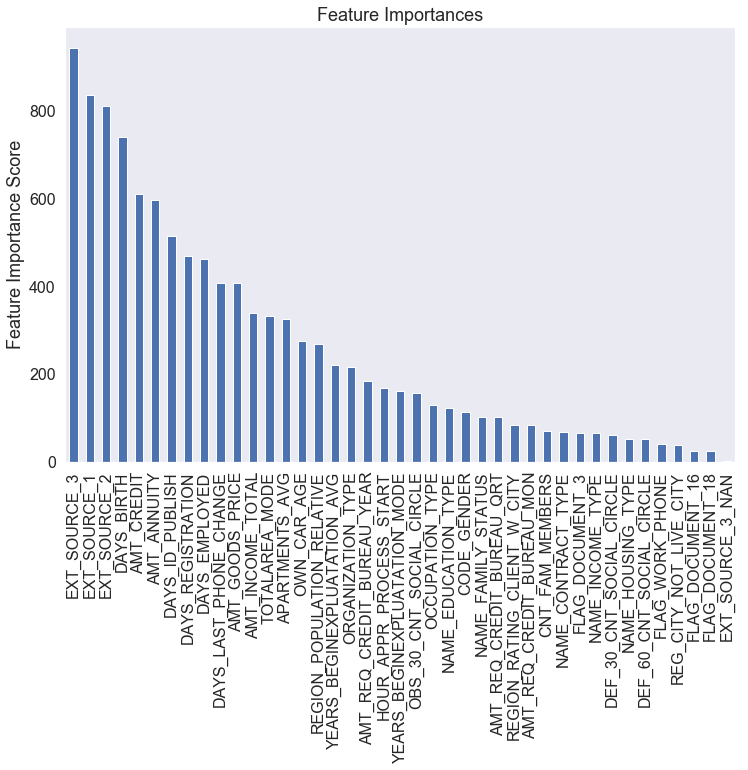

In [30]:
evaluation.modelfit(XGB_model, X_train, y_train, X_test, y_test, useTrainCV=True, cv_folds=n_splits_outter, early_stopping_rounds=early_stopping_rounds)

In [33]:
gc.collect()

0

Then we are going to tune **max_depth** and **min_child_weight** with a nested cross validation setting.
* The inner loop will find the optimal values and generate a best_estimator
* The outter loop will estimate the score of each best_estimator and generate more best_estimator samples, in order to generate a better understanding of the distribution (more than one best_estimator is better than one)

In [32]:
xgb_cv = {'max_depth': range(3,7,1),
        'min_child_weight': range(1,6,2)
         }

n_splits_inner = 5

gridCV = GridSearchCV(XGB_model, param_grid=xgb_cv, verbose=1, scoring='roc_auc', cv=n_splits_inner)

In [33]:
estimated_scores, best_estimators, best_params = evaluation.nested_cross_val_model(X_train, y_train, gridCV, n_splits_outter=n_splits_outter, use_random_state=True)

Fit GridSearchCV - outter fold 1
Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed: 123.4min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=5, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.759011032420839
-----------------------------Best Parameters:-----------------------------
{'max_depth': 4, 'min_child_weight': 5}
--------------------------Outter Score Estimation:------------------------
0.7561891174638785

Fit GridSearchCV - outter fold 2
Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed: 123.5min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=5, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7576429223060157
-----------------------------Best Parameters:-----------------------------
{'max_depth': 4, 'min_child_weight': 5}
--------------------------Outter Score Estimation:------------------------
0.7621383257060593

Fit GridSearchCV - outter fold 3
Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed: 122.5min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=1, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7582954447976341
-----------------------------Best Parameters:-----------------------------
{'max_depth': 4, 'min_child_weight': 1}
--------------------------Outter Score Estimation:------------------------
0.7593560039461392

Fit GridSearchCV - outter fold 4
Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed: 123.5min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=5, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7573547918880561
-----------------------------Best Parameters:-----------------------------
{'max_depth': 4, 'min_child_weight': 5}
--------------------------Outter Score Estimation:------------------------
0.7657283496988395

Fit GridSearchCV - outter fold 5
Fitting 5 folds for each of 12 candidates, totalling 60 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed: 123.5min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=3, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7605721205014968
-----------------------------Best Parameters:-----------------------------
{'max_depth': 4, 'min_child_weight': 3}
--------------------------Outter Score Estimation:------------------------
0.7540193099443065



In [34]:
np.mean(estimated_scores)

0.7594862213518446

In [35]:
best_params

[{'max_depth': 4, 'min_child_weight': 5},
 {'max_depth': 4, 'min_child_weight': 5},
 {'max_depth': 4, 'min_child_weight': 1},
 {'max_depth': 4, 'min_child_weight': 5},
 {'max_depth': 4, 'min_child_weight': 3}]

In [36]:
gc.collect()

25

As we can see, the min_child_weight is not static within our cross validation scores. One could infer that this hyperparameter does not affect the learning. Also, we can say that these are the best hyperparameters for each fold used in cross-validation, given that each fold can have its own distribution within the features.

Let's use another round of gridsearch to better understand this value:

In [125]:
#Using the optimal max_depth value:
xgb_params_fixed['max_depth'] = 4
#We cannot forget to update the n_estimators optimal value in order to use xgb_params_fixed variable:
xgb_params_fixed['n_estimators'] = 377

In [126]:
XGB_model.set_params(**xgb_params_fixed)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=1, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)

In [36]:
#using more min_child_weight values:
xgb_cv = {'min_child_weight': range(1,8,1)
         }

n_splits_inner = 5

gridCV = GridSearchCV(XGB_model, param_grid=xgb_cv, verbose=1, scoring='roc_auc', cv=n_splits_inner)

In [38]:
estimated_scores, best_estimators, best_params = evaluation.nested_cross_val_model(X_train, y_train, gridCV, n_splits_outter=n_splits_outter)

Fit GridSearchCV - outter fold 1
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed: 66.5min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=7, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.759198851113402
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 7}
--------------------------Outter Score Estimation:------------------------
0.7566493471283602

Fit GridSearchCV - outter fold 2
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed: 67.7min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=5, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7576429223060157
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 5}
--------------------------Outter Score Estimation:------------------------
0.7621383257060593

Fit GridSearchCV - outter fold 3
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed: 69.0min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=7, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7584701417321023
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 7}
--------------------------Outter Score Estimation:------------------------
0.7590402616911573

Fit GridSearchCV - outter fold 4
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed: 67.4min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=4, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7573719322537982
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 4}
--------------------------Outter Score Estimation:------------------------
0.7645394376492872

Fit GridSearchCV - outter fold 5
Fitting 5 folds for each of 7 candidates, totalling 35 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed: 67.4min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=3, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7605721205014968
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 3}
--------------------------Outter Score Estimation:------------------------
0.7540193099443065



In [39]:
np.mean(estimated_scores)

0.7592773364238341

In [40]:
best_params

[{'min_child_weight': 7},
 {'min_child_weight': 5},
 {'min_child_weight': 7},
 {'min_child_weight': 4},
 {'min_child_weight': 3}]

In [119]:
gc.collect()

185

The best min_child_weight is 7, but we didn't try bigger values than 7. Let's try:

In [39]:
#using more min_child_weight values:
xgb_cv = {'min_child_weight': range(6,10,1)
         }

n_splits_inner = 5

gridCV = GridSearchCV(XGB_model, param_grid=xgb_cv, verbose=1, scoring='roc_auc', cv=n_splits_inner)

In [40]:
estimated_scores, best_estimators, best_params = evaluation.nested_cross_val_model(X_train, y_train, gridCV, n_splits_outter=n_splits_outter)

Fit GridSearchCV - outter fold 1
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed: 37.9min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=7, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.759198851113402
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 7}
--------------------------Outter Score Estimation:------------------------
0.7566493471283602

Fit GridSearchCV - outter fold 2
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed: 37.8min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=9, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7576914283524698
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 9}
--------------------------Outter Score Estimation:------------------------
0.7623605744639298

Fit GridSearchCV - outter fold 3
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed: 37.9min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=9, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7585784890199502
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 9}
--------------------------Outter Score Estimation:------------------------
0.759333318184567

Fit GridSearchCV - outter fold 4
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed: 39.9min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=7, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7573463854015509
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 7}
--------------------------Outter Score Estimation:------------------------
0.7647150450176121

Fit GridSearchCV - outter fold 5
Fitting 5 folds for each of 4 candidates, totalling 20 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed: 41.1min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=9, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7605097495634628
-----------------------------Best Parameters:-----------------------------
{'min_child_weight': 9}
--------------------------Outter Score Estimation:------------------------
0.7534955866505832



In [41]:
np.mean(estimated_scores)

0.7593107742890105

In [42]:
best_params

[{'min_child_weight': 7},
 {'min_child_weight': 9},
 {'min_child_weight': 9},
 {'min_child_weight': 7},
 {'min_child_weight': 9}]

In [48]:
gc.collect()

255

We could continue setting higher values for min_child_weight, but let's stop it for now, as this takes too long to run and the real value is in feature engineering.

In [127]:
#Using the optimal min_child_weight value:
xgb_params_fixed['min_child_weight'] = 9

In [128]:
XGB_model.set_params(**xgb_params_fixed)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=4, min_child_weight=9, missing=None, n_estimators=377,
       n_jobs=4, nthread=None, objective='rank:pairwise', random_state=10,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
       silent=True, subsample=0.8)

Now, we are going to tune **gamma**:

In [51]:
xgb_cv = {'gamma': [i/10.0 for i in range(0,5)]
         }

n_splits_inner = 5

gridCV = GridSearchCV(XGB_model, param_grid=xgb_cv, verbose=1, scoring='roc_auc', cv=n_splits_inner)

In [54]:
estimated_scores, best_estimators, best_params = evaluation.nested_cross_val_model(X_train, y_train, gridCV, n_splits_outter=n_splits_outter, use_random_state=True)

Fit GridSearchCV - outter fold 1
Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed: 48.6min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.1, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7590262875544976
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.1}
--------------------------Outter Score Estimation:------------------------
0.7567642984541695

Fit GridSearchCV - outter fold 2
Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed: 51.2min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.0, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7576914283524698
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.0}
--------------------------Outter Score Estimation:------------------------
0.7623605744639298

Fit GridSearchCV - outter fold 3
Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed: 49.4min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.0, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7585784890199502
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.0}
--------------------------Outter Score Estimation:------------------------
0.759333318184567

Fit GridSearchCV - outter fold 4
Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed: 47.8min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.3, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7576455199863285
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.3}
--------------------------Outter Score Estimation:------------------------
0.765083253731932

Fit GridSearchCV - outter fold 5
Fitting 5 folds for each of 5 candidates, totalling 25 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed: 47.8min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.1, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7611558251787829
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.1}
--------------------------Outter Score Estimation:------------------------
0.7539499704687026



In [55]:
np.mean(estimated_scores)

0.7594982830606603

In [56]:
best_params

[{'gamma': 0.1},
 {'gamma': 0.0},
 {'gamma': 0.0},
 {'gamma': 0.3},
 {'gamma': 0.1}]

In [57]:
gc.collect()

25

Fine tuning gamma with smaller intervals:

In [315]:
xgb_cv = {'gamma': [i/100.0 for i in range(0,11)]
         }

n_splits_inner = 5

gridCV = GridSearchCV(XGB_model, param_grid=xgb_cv, verbose=1, scoring='roc_auc', cv=n_splits_inner)

In [316]:
estimated_scores, best_estimators, best_params = evaluation.nested_cross_val_model(X_train, y_train, gridCV, n_splits_outter=n_splits_outter, use_random_state=True)

Fit GridSearchCV - outter fold 1
Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed: 104.4min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.03, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7592288552675852
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.03}
--------------------------Outter Score Estimation:------------------------
0.7565037516436413

Fit GridSearchCV - outter fold 2
Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed: 104.3min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.01, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7577807136299496
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.01}
--------------------------Outter Score Estimation:------------------------
0.7623605744639298

Fit GridSearchCV - outter fold 3
Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed: 103.3min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.09, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7586719583965531
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.09}
--------------------------Outter Score Estimation:------------------------
0.7592084684208303

Fit GridSearchCV - outter fold 4
Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed: 104.7min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.06, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7573807887822956
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.06}
--------------------------Outter Score Estimation:------------------------
0.7650108440359544

Fit GridSearchCV - outter fold 5
Fitting 5 folds for each of 11 candidates, totalling 55 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed: 105.4min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.08, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7611588039702116
-----------------------------Best Parameters:-----------------------------
{'gamma': 0.08}
--------------------------Outter Score Estimation:------------------------
0.7539126769680741



In [317]:
np.mean(estimated_scores)

0.7593992631064859

In [318]:
best_params

[{'gamma': 0.03},
 {'gamma': 0.01},
 {'gamma': 0.09},
 {'gamma': 0.06},
 {'gamma': 0.08}]

In [319]:
gc.collect()

25

In [60]:
round(np.mean(np.array([0.03, 0.01, 0.09, 0.06, 0.08])), 2)

0.05

In [129]:
#Using the mean of optimal gamma values:
xgb_params_fixed['gamma'] = 0.05

In [130]:
XGB_model.set_params(**xgb_params_fixed)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=377, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)

Recalibrating the n_estimators value for the optimal hyperparameters so far:

In [70]:
xgb_params_fixed['n_estimators'] = 1000
XGB_model.set_params(**xgb_params_fixed)


Model Report
Number of estimators (early stopping and cross-validation):  616
AUC Score (Train): 0.797595
AUC Score (Test): 0.756979


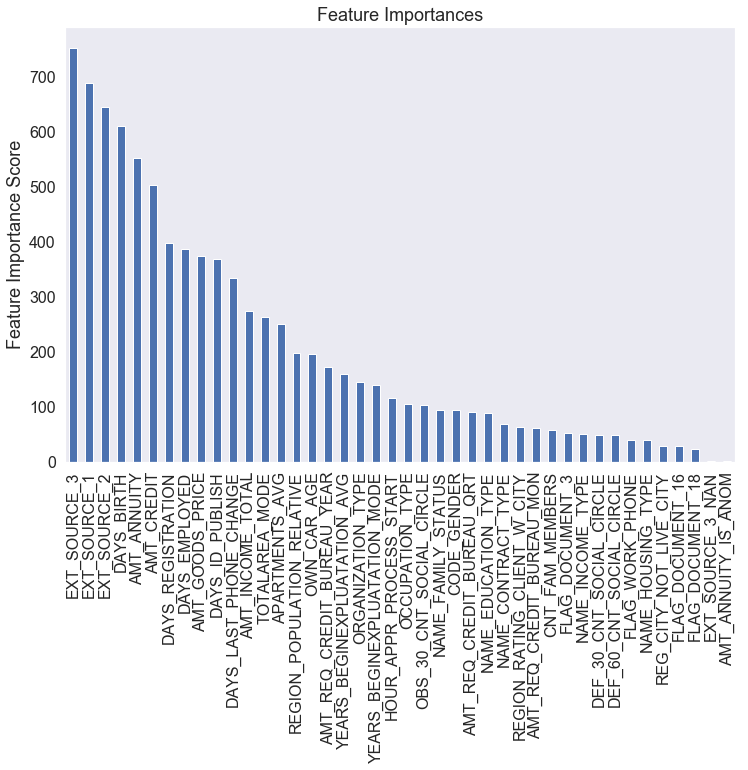

In [73]:
evaluation.modelfit(XGB_model, X_train, y_train, X_test, y_test, useTrainCV=True, cv_folds=n_splits_outter, early_stopping_rounds=early_stopping_rounds)

In [131]:
xgb_params_fixed['n_estimators'] = 616
XGB_model.set_params(**xgb_params_fixed)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)

Now, we are going to tune **subsample** and **colsample_bytree**:

In [41]:
xgb_cv = {'subsample': [i/10.0 for i in range(7,10)],
        'colsample_bytree': [i/10.0 for i in range(7,10)]
         }

n_splits_inner = 5

gridCV = GridSearchCV(XGB_model, param_grid=xgb_cv, verbose=1, scoring='roc_auc', cv=n_splits_inner)

In [43]:
estimated_scores, best_estimators, best_params = evaluation.nested_cross_val_model(X_train, y_train, gridCV, n_splits_outter=n_splits_outter, use_random_state=True)

Fit GridSearchCV - outter fold 1
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 143.3min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7594169515609461
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.8, 'subsample': 0.8}
--------------------------Outter Score Estimation:------------------------
0.7570688644984905

Fit GridSearchCV - outter fold 2
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 143.0min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.9, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.9)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7580054205371598
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.9, 'subsample': 0.9}
--------------------------Outter Score Estimation:------------------------
0.7630240775622242

Fit GridSearchCV - outter fold 3
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 142.0min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.7)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7593302548747614
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.8, 'subsample': 0.7}
--------------------------Outter Score Estimation:------------------------
0.7594474771594517

Fit GridSearchCV - outter fold 4
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 139.7min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.9, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.7)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7581167578509219
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.9, 'subsample': 0.7}
--------------------------Outter Score Estimation:------------------------
0.7655550867824621

Fit GridSearchCV - outter fold 5
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 140.1min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7608839646560296
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.8, 'subsample': 0.8}
--------------------------Outter Score Estimation:------------------------
0.7552093810240428



In [44]:
np.mean(estimated_scores)

0.7600609774053343

In [45]:
best_params

[{'colsample_bytree': 0.8, 'subsample': 0.8},
 {'colsample_bytree': 0.9, 'subsample': 0.9},
 {'colsample_bytree': 0.8, 'subsample': 0.7},
 {'colsample_bytree': 0.9, 'subsample': 0.7},
 {'colsample_bytree': 0.8, 'subsample': 0.8}]

In [65]:
gc.collect()

7

Fine tuning with 0.5 intervals:

In [66]:
xgb_cv = {'subsample': [i/100.0 for i in range(70,85,5)],
        'colsample_bytree': [i/100.0 for i in range(80,95,5)]
         }

n_splits_inner = 5

gridCV = GridSearchCV(XGB_model, param_grid=xgb_cv, verbose=1, scoring='roc_auc', cv=n_splits_inner)

In [68]:
estimated_scores, best_estimators, best_params = evaluation.nested_cross_val_model(X_train, y_train, gridCV, n_splits_outter=n_splits_outter, use_random_state=True)

Fit GridSearchCV - outter fold 1
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 142.6min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.9, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.75)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.759617560743276
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.9, 'subsample': 0.75}
--------------------------Outter Score Estimation:------------------------
0.7563408299070598

Fit GridSearchCV - outter fold 2
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 143.2min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.85, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7579656968460368
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.85, 'subsample': 0.8}
--------------------------Outter Score Estimation:------------------------
0.7627399578143585

Fit GridSearchCV - outter fold 3
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 144.1min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.7)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7593302548747614
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.8, 'subsample': 0.7}
--------------------------Outter Score Estimation:------------------------
0.7594474771594517

Fit GridSearchCV - outter fold 4
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 143.3min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.85, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.75)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7581636570167157
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.85, 'subsample': 0.75}
--------------------------Outter Score Estimation:------------------------
0.7643951900748802

Fit GridSearchCV - outter fold 5
Fitting 5 folds for each of 9 candidates, totalling 45 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed: 143.7min finished


------------------------------Best Estimator:-----------------------------
XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.8, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.8)
-----------------------------Best Inner Score:----------------------------
Mean cross-validated score of the best_estimator:
0.7608839646560296
-----------------------------Best Parameters:-----------------------------
{'colsample_bytree': 0.8, 'subsample': 0.8}
--------------------------Outter Score Estimation:------------------------
0.7552093810240428



In [69]:
np.mean(estimated_scores)

0.7596265671959586

In [78]:
estimated_scores

[0.7563408299070598,
 0.7627399578143585,
 0.7594474771594517,
 0.7643951900748802,
 0.7552093810240428]

In [70]:
best_params

[{'colsample_bytree': 0.9, 'subsample': 0.75},
 {'colsample_bytree': 0.85, 'subsample': 0.8},
 {'colsample_bytree': 0.8, 'subsample': 0.7},
 {'colsample_bytree': 0.85, 'subsample': 0.75},
 {'colsample_bytree': 0.8, 'subsample': 0.8}]

In [72]:
gc.collect()

0

As we can see, there is no clear pair of parameters. So we will use the **best outer score estimation** and its parameters.

In [132]:
#Using the optimal subsample and colsample_bytree values:
xgb_params_fixed['subsample'] = 0.75
xgb_params_fixed['colsample_bytree'] = 0.85

In [133]:
XGB_model.set_params(**xgb_params_fixed)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.85, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.75)

Checking the improvement so far using test sample:


Model Report
AUC Score (Train): 0.797719
AUC Score (Test): 0.755918


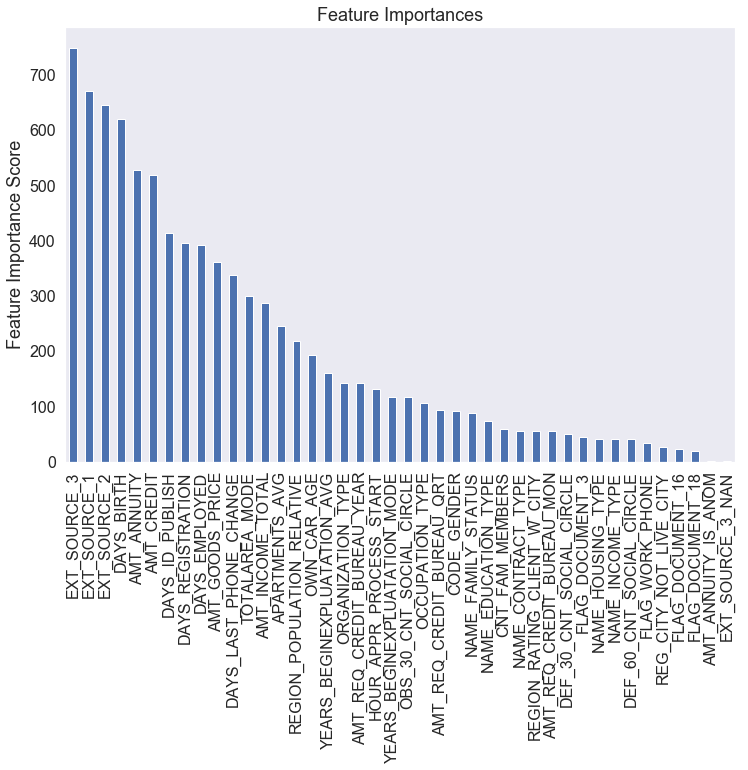

In [86]:
evaluation.modelfit(XGB_model, X_train, y_train, X_test, y_test, useTrainCV=False, cv_folds=n_splits_outter, early_stopping_rounds=early_stopping_rounds)

In [204]:
#Summary with the tuned parameters:
xgb_params_fixed = {}
#Default xgboost learning rate value:
xgb_params_fixed['learning_rate'] = 0.1
xgb_params_fixed['n_estimators'] = 616
xgb_params_fixed['objective'] = 'rank:pairwise'
xgb_params_fixed['n_jobs'] = 4
xgb_params_fixed['max_depth'] = 4
xgb_params_fixed['min_child_weight'] = 9
xgb_params_fixed['gamma'] = 0.05
xgb_params_fixed['subsample'] = 0.75
xgb_params_fixed['colsample_bytree'] = 0.85
xgb_params_fixed['scale_pos_weight'] = 1

**Comparing with baseline model**:

In [144]:
xgb_params = xgb_params_fixed.copy()
xgb_params['random_state'] = 10

In [48]:
XGB_model = XGBClassifier(**xgb_params)

In [49]:
cross_score = evaluation.cross_val_model(X, y, XGB_model, use_random_state=True)

In [50]:
print("Cross_scores: ", cross_score)
print("Mean cross_score: %.5f" % cross_score.mean())

Cross_scores:  [0.75971565 0.75529307 0.76178984]
Mean cross_score: 0.75893


In [51]:
gc.collect()

13

**Comparing the predictions using the tunned model:**

In [208]:
xgb_params = xgb_params_fixed.copy()
xgb_params['random_state'] = 10

In [209]:
XGB_model = XGBClassifier(**xgb_params)

In [210]:
XGB_model.fit(X, y)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.85, gamma=0.05, learning_rate=0.1,
       max_delta_step=0, max_depth=4, min_child_weight=9, missing=None,
       n_estimators=616, n_jobs=4, nthread=None, objective='rank:pairwise',
       random_state=10, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
       seed=None, silent=True, subsample=0.75)

Import the test (submission) dataset:

In [166]:
application_test = pd.read_csv(path + 'application_test.csv')

Checking if there are values within test set which are not in train set (categorical, binary and ordinal):

In [294]:
def check_values_test(train_data, test_data, columns):
    for col in columns:
        val_notin_train = []
        if "DAYS" not in col.upper():
            for value in test_data[col].unique():
                if value not in train_data[col].unique():
                    val_notin_train.append(value)
            if len(val_notin_train) != 0:
                print("Values not in train data for feature ", col, ": ",val_notin_train)
check_values_test(application_train, application_test, col_categorical)
check_values_test(application_train, application_test, col_binary)
check_values_test(application_train, application_test, col_ordinal)

Values not in train data for feature  NAME_TYPE_SUITE :  [nan]
Values not in train data for feature  OCCUPATION_TYPE :  [nan]
Values not in train data for feature  FONDKAPREMONT_MODE :  [nan]
Values not in train data for feature  HOUSETYPE_MODE :  [nan]
Values not in train data for feature  WALLSMATERIAL_MODE :  [nan]
Values not in train data for feature  EMERGENCYSTATE_MODE :  [nan]
Values not in train data for feature  CNT_CHILDREN :  [20]
Values not in train data for feature  REGION_RATING_CLIENT_W_CITY :  [-1]


Checking CNT_CHILDREN:

In [295]:
application_test["CNT_CHILDREN"].value_counts()[20]

1

There is only one "20" value. Now checking REGION_RATING_CLIENT_W_CITY:

In [296]:
application_test["REGION_RATING_CLIENT_W_CITY"].value_counts()[-1]

1

There is only one "-1" value.

In [168]:
X_sub = preprocessing.return_test_data_tree(application_test, col_binary_reduced, col_categorical_reduced, np.delete(all_columns_reduced, [0]), new_nan_features=list_nan_features, new_is_anom_features=list_anom_features)

In [180]:
sub_prob_preds = utils.sigmoid(XGB_model.predict_proba(X_sub)[:,1])

In [181]:
sub = pd.DataFrame()
sub['SK_ID_CURR'] = application_test["SK_ID_CURR"]
sub['TARGET'] = sub_prob_preds
sub.to_csv(output_path + 'prediction.csv', index=False)

Generating a visualization of the separability between DEFAULT and NOT DEFAULT, given the predicted probability:

In [239]:
target_1 = utils.sigmoid(XGB_model.predict_proba(X[y==1])[:,1])
target_0 = utils.sigmoid(XGB_model.predict_proba(X[y==0])[:,1])

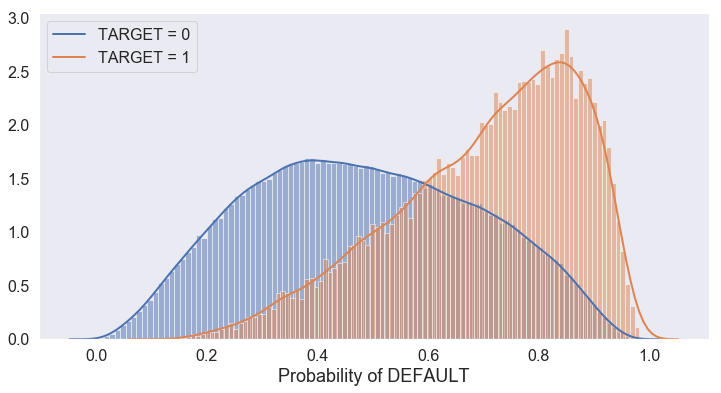

In [263]:
plt.figure(figsize=(12,6))
sns.distplot(target_0, bins=100, norm_hist=True, hist_kws={'alpha':0.5}, axlabel='Probability of DEFAULT', kde_kws={'label': 'TARGET = 0'})
sns.distplot(target_1, bins=100, norm_hist=True, hist_kws={'alpha':0.5}, kde_kws={'label': 'TARGET = 1'})

As we can see, there is an overlap between the 2 classes. The goal for the next implementations is to reduce the amount of overlap.